### Etudients:
    - DIAB Hicham
    - BOUTICHE Ahmed

**P.S: Veuillez lire les détails du projet disponible sur le fichier readme `readme.md`**

## importe des librairies nécessaires


In [1]:
import cv2
import glob as gb
import numpy as np
import matplotlib.pylab as plt


## Fonction utilisee


- `sift_matche`: &nbsp;Fonction qui retourne les bons matcher entre 2 images


In [2]:
def sift_matches(img1, img2, match_ratio=0.75, shrink=1, display_matches=False):
    """
        find the best matching between 2 images by using sift detector

    Args:
        img1 (numpy_array): first image
        img2 (numpy_array): secend image
        match_ratio (float): threshold for the good matches. Defaults = 0.75
        shrink (float): shrink ratio.  Defaults = 1
        display_matches (bool, optional): for displying the sift matches if display_matches=True.  Defaults to False.

    Returns:
        numpy_array: good matches
    """
    # if img1 and img2 are in rgb --> convert them in gray scale
    if img1.ndim > 2:
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    if img2.ndim > 2:
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    # if shrink ratio is under 1 we shrink the images
    if shrink < 1:
        img1 = cv2.resize(
            img1, (0, 0), fx=shrink, fy=shrink, interpolation=cv2.INTER_CUBIC
        )
        img2 = cv2.resize(
            img2, (0, 0), fx=shrink, fy=shrink, interpolation=cv2.INTER_CUBIC
        )

    # Initiate SIFT detector
    sift = cv2.SIFT_create()
    # find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)
    # Initiate BFMatcher
    bf = cv2.BFMatcher()
    # get all matches
    all_matches = bf.knnMatch(des1, des2, k=2)
    # get best matches by using match_ratio
    matches = np.asarray(
        [[m] for m, d in all_matches if m.distance < match_ratio * d.distance]
    )

    # we display the sift matches if display_matches=True
    if display_matches:
        # draw good matches
        matchedKnn_img = cv2.drawMatchesKnn(
            img1, kp1, img2, kp2, matches, img1, matchColor=(0, 255, 0), flags=2
        )
        # show matching image
        plt.imshow(matchedKnn_img[:, :, ::-1]), plt.title(
            "SIFT's good matches"
        ), plt.axis("off")
        plt.show()

    return matches


- `is_find_mat`: &nbsp; Fonction qui trouve le best matche entre matricule requete et les matricules autorisés


In [3]:
def is_find_mat(query_mat, auto_mats, auto_cars, score_threshold, display_matches):
    """
       finds the best match between the query-license-plate and the list of authorized-license-plates, 
       and apply threshold to determine if the query-car is authorize or not

    Args:
        query_mat (numpy_array): _description_
        auto_mats (list): list of authorized_license-plates
        auto_cars (list): list of authorized_cars 
        score_threshold (int): to apply a threshold on matche_score, to know if the query_mat exists among the authorized auto_mats
        display_matches (bool): for displaying the sift matches
    
    Returns:
        find(bool): True if we find realy good matche
        find_car(numpy_array): find car among the authorized_cars
        find_mat(numpy_array): find license-plates among the authorized_license-plates
        matche_score(int): the best matche_score that we find
    """
    find = False
    lst = np.array([])
#  find good matches for each authorize-mat and query_mat
    for auto_mat in auto_mats:
        matches = sift_matches(
            query_mat,
            auto_mat,
            display_matches=display_matches,
        )
        lst = np.append(lst, len(matches))

#  get the index of the authorize_license-plates with the greatest number of matches among the list auto_mats
    max_idx = lst.argsort()[-1]
#  greatest number of matches 
    matche_score = lst[max_idx]
# apply a threshold on matche_score, to know if the query_mat exists among the list of authorized__license-plates auto_mats
    if matche_score > score_threshold:
        find = True
# get car and mat of the authorize-mat with the greatest number of matches among the list auto_mats
    find_car = auto_cars[max_idx]
    find_mat = auto_mats[max_idx]

    return find, find_car, find_mat, matche_score


## Extraction des matricules autorisee


Extraction des matricules des voitures autorisée, grace un modele pre entraine l'utilisation du modele se fait au niveau du script `extract_matpy`

In [4]:
from extract_mat import extract_mat

car_path = "./dataset/authorized/car"
mat_path = "./dataset/authorized/mat"

extract_mat(car_path, mat_path)


Loading model successfully...
image 0 saved!!
image 1 saved!!
image 2 saved!!
image 3 saved!!
image 4 saved!!
image 5 saved!!
image 6 saved!!
image 7 saved!!
image 8 saved!!
image 9 saved!!
image 10 saved!!
image 11 saved!!
image 12 saved!!
image 13 saved!!
image 14 saved!!
image 15 saved!!
image 16 saved!!
image 17 saved!!
image 18 saved!!
image 19 saved!!
image 20 saved!!
image 21 saved!!
image 22 saved!!
image 23 saved!!
image 24 saved!!
image 25 saved!!
image 26 saved!!
image 27 saved!!
image 28 saved!!
image 29 saved!!
image 30 saved!!
image 31 saved!!
image 32 saved!!
image 33 saved!!


## Lecture des images (voitures, matricules) autorisee


lire les images de voitures et matricules autorisee. 

In [5]:
car_images_path = sorted(gb.glob(car_path + "/*.jpg"), key=len)
auto_cars = [cv2.imread(img) for img in car_images_path]
print(f"numbre of cars ... {len(car_images_path)}")

mat_images_path = sorted(gb.glob(mat_path + "/*.jpg"), key=len)
auto_mats = [cv2.imread(img) for img in mat_images_path]
print(f"numbre of license plates ... {len(mat_images_path)}")


numbre of cars ... 34
numbre of license plates ... 34


On met les images de voiture dans la liste `auto_cars` et les matricule dans la liste `auto_mats` de sorte que chaque voiture a son matricule sur le meme index.<br/><br/>
i.e voiture `auto_cars[i]` son matricule est `auto_mats[i]`

- Example: on affiche les 3 premiers voiture de `auto_cars` ainsi que leur matricule disponible dans  `auto_mats`

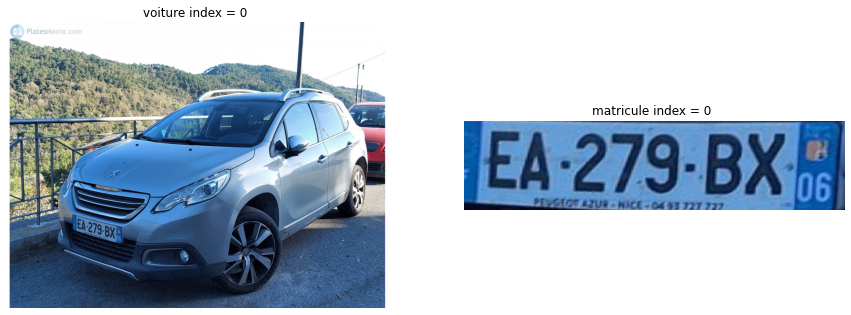

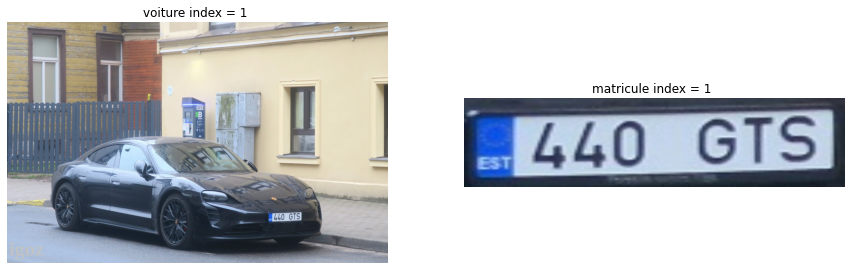

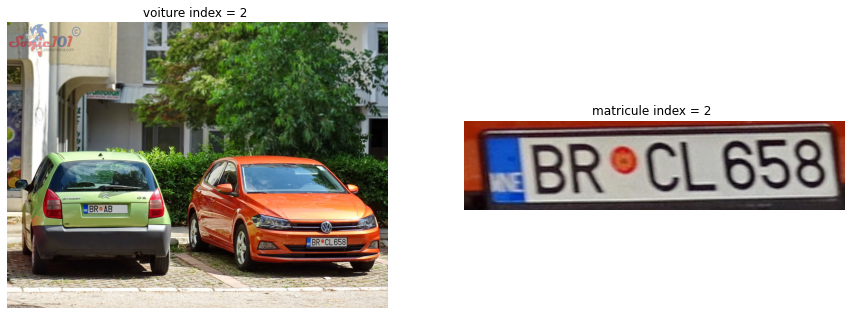

In [6]:
for i in range(3):
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(auto_cars[i][:,:,::-1]), plt.axis("off")
    plt.title(f'voiture index = {i} ')
    plt.subplot(1, 2, 2)
    plt.imshow(auto_mats[i][:,:,::-1]), plt.axis("off")
    plt.title(f'matricule index = {i} ')
    plt.show()

## Extraction des matricules requete


Extraction des matricules des voitures requete grace modele précédent

In [7]:
car_path = "./dataset/query/car"
mat_path = "./dataset/query/mat"

extract_mat(car_path, mat_path)


Loading model successfully...
image 0 saved!!
image 1 saved!!
image 2 saved!!
image 3 saved!!
image 4 saved!!
image 5 saved!!
image 6 saved!!
image 7 saved!!
image 8 saved!!
image 9 saved!!
image 10 saved!!
image 11 saved!!
image 12 saved!!
image 13 saved!!
image 14 saved!!
image 15 saved!!
image 16 saved!!
image 17 saved!!
image 18 saved!!
image 19 saved!!
image 20 saved!!
image 21 saved!!
image 22 saved!!


## Lecture des images (voitures, matricules) requete


lire les images de voitures et matricules requete

In [8]:
car_images_path = sorted(gb.glob(car_path + "/*.jpg"), key=len)
query_cars = [cv2.imread(img) for img in car_images_path]
print(f"numbre of cars ... {len(car_images_path)}")

mat_images_path = sorted(gb.glob(mat_path + "/*.jpg"), key=len)
query_mats = [cv2.imread(img) for img in mat_images_path]
print(f"numbre of license plates ... {len(mat_images_path)}")


numbre of cars ... 23
numbre of license plates ... 23


On met les images de voiture dans la liste `query_cars` et les matricule dans la liste `query_mats` de sorte que chaque voiture a son matricule sur le meme index. <br/><br/>
i.e voiture `query_cars[i]` son matricule est `query_mats[i]`

- Example: on affiche les 3 premiers voiture de `query_cars` ainsi que leur matricule disponible dans  `query_mats`

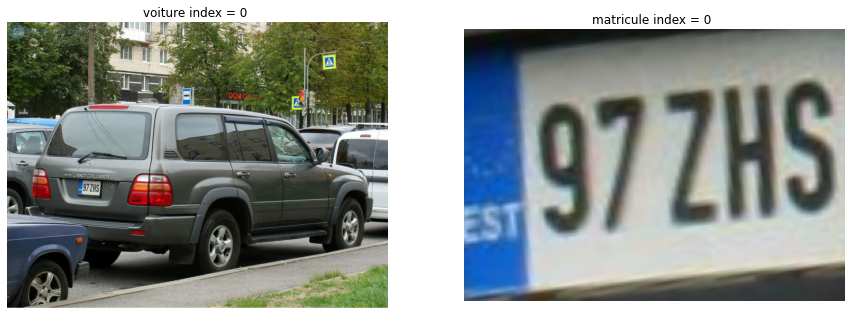

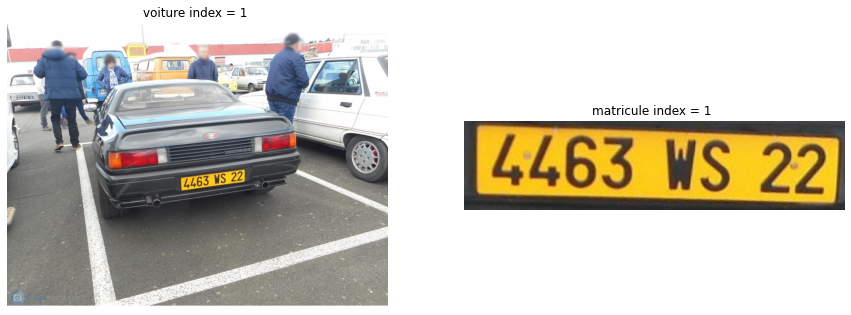

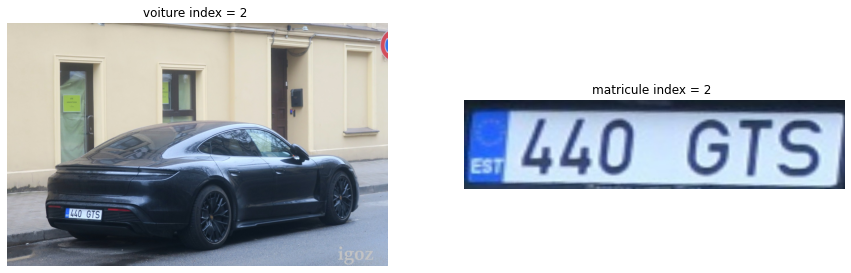

In [9]:
for i in range(3):
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(query_cars[i][:,:,::-1]), plt.axis("off")
    plt.title(f'voiture index = {i} ')
    plt.subplot(1, 2, 2)
    plt.imshow(query_mats[i][:,:,::-1]), plt.axis("off")
    plt.title(f'matricule index = {i} ')
    plt.show()

## Trouve les voitures autorisées

On trouve les voitures autorisées parmi les voitures requete en trouvant le best matching entre le matricule de la voiture requete et les matriculent des voitures autorisées

- Best matche score = 28.0 > 15
- Query license-plate = find (car authorized)


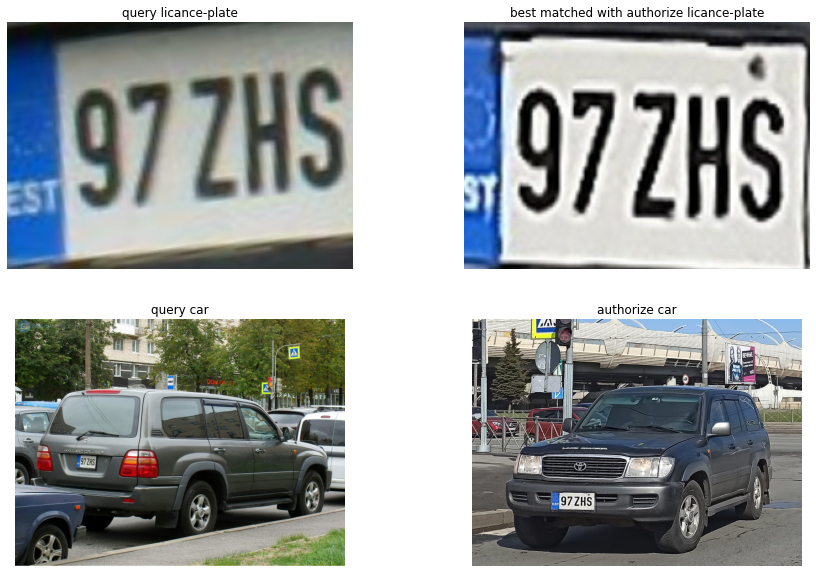

- Best matche score = 66.0 > 15
- Query license-plate = find (car authorized)


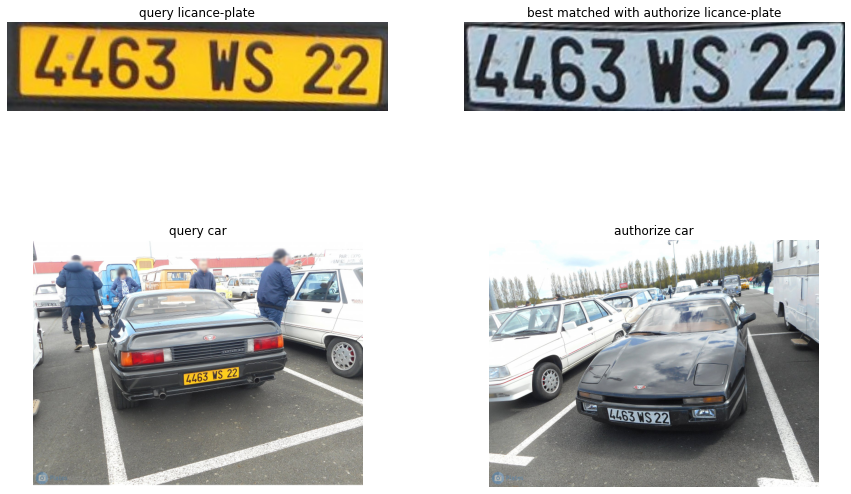

- Best matche score = 45.0 > 15
- Query license-plate = find (car authorized)


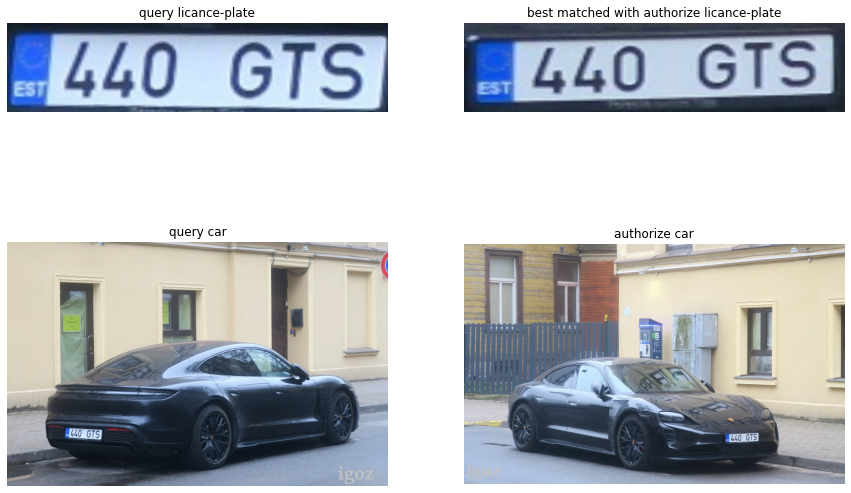

- Best matche score = 43.0 > 15
- Query license-plate = find (car authorized)


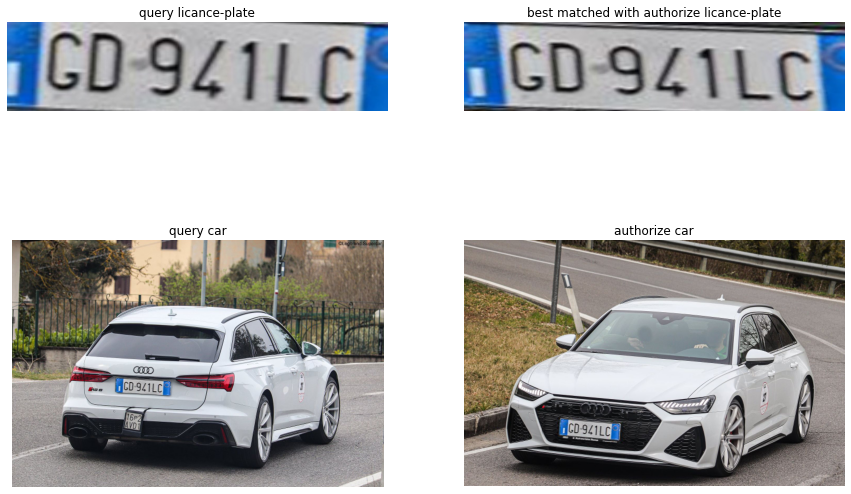

- Best matche score = 40.0 > 15
- Query license-plate = find (car authorized)


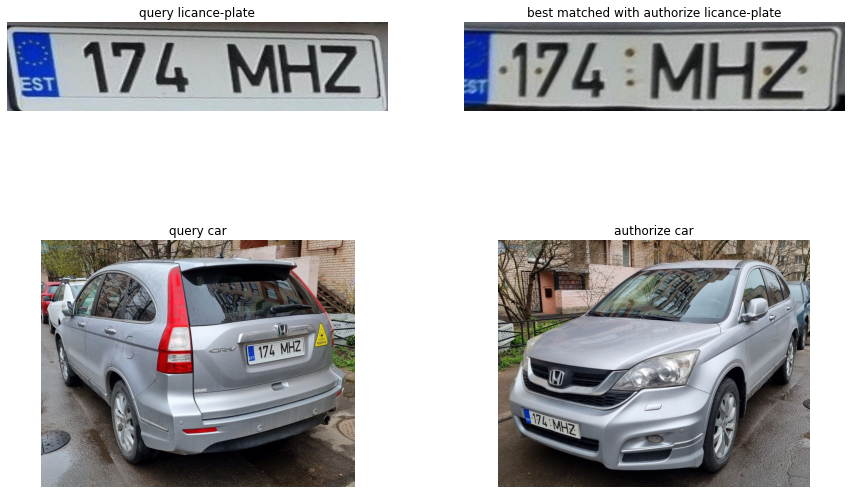

- Best matche score = 46.0 > 15
- Query license-plate = find (car authorized)


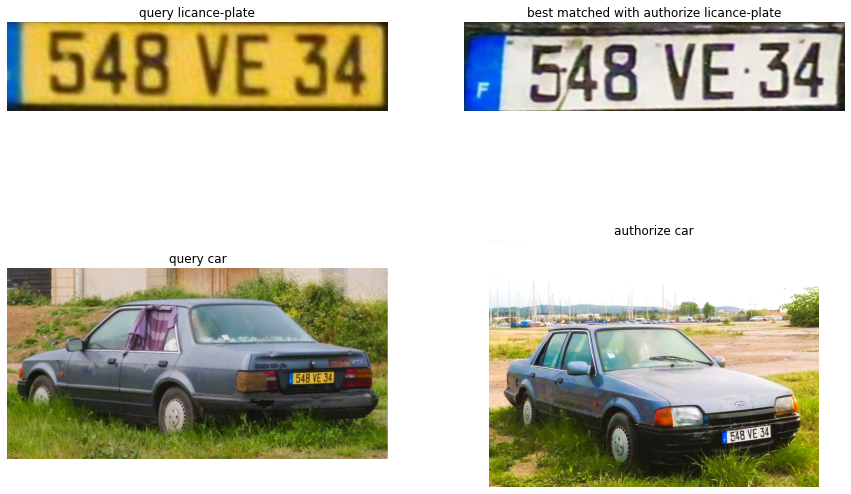

- Best matche score = 60.0 > 15
- Query license-plate = find (car authorized)


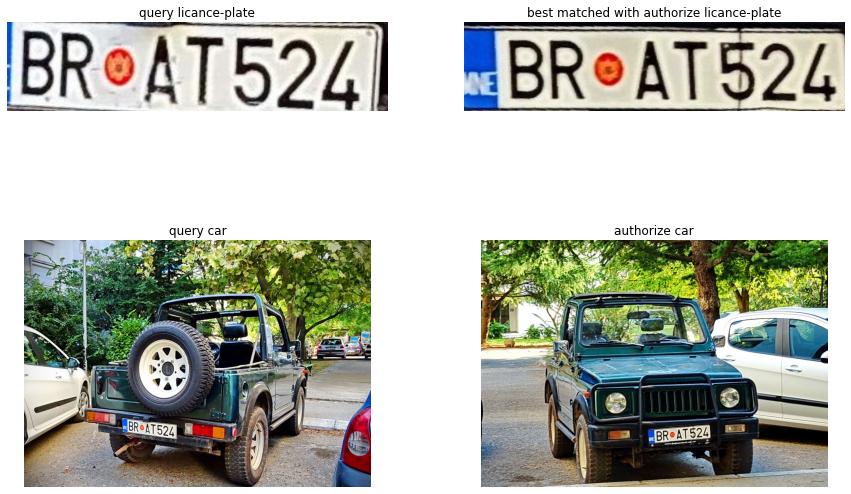

- Best matche score = 55.0 > 15
- Query license-plate = find (car authorized)


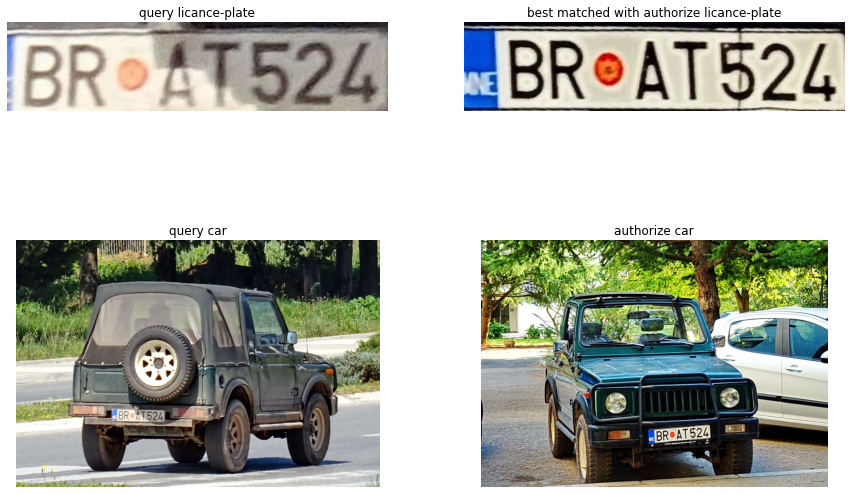

- Best matche score = 56.0 > 15
- Query license-plate = find (car authorized)


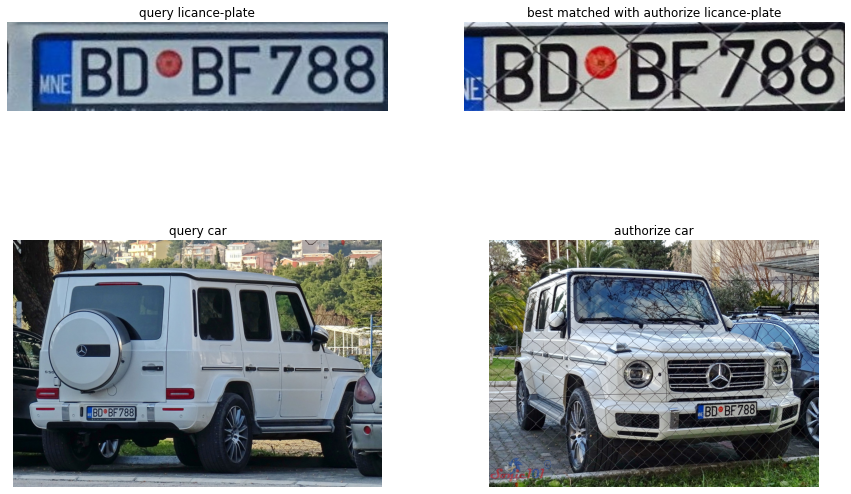

- Best matche score = 35.0 > 15
- Query license-plate = find (car authorized)


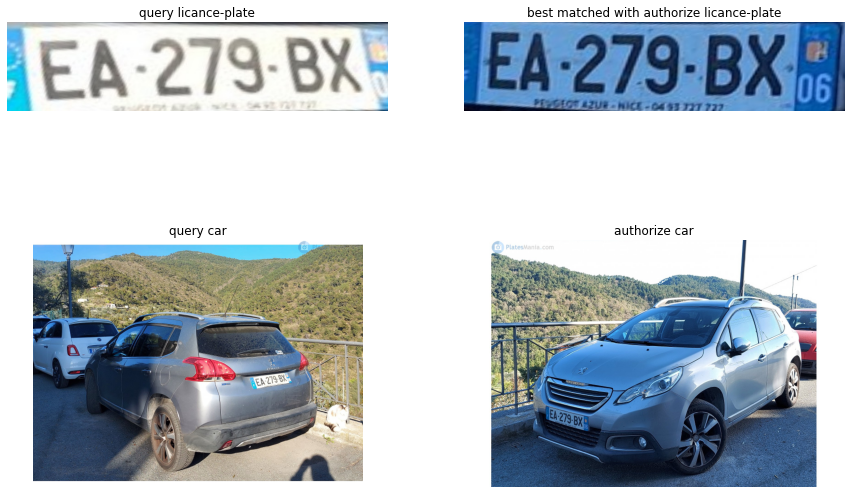

- Best matche score = 56.0 > 15
- Query license-plate = find (car authorized)


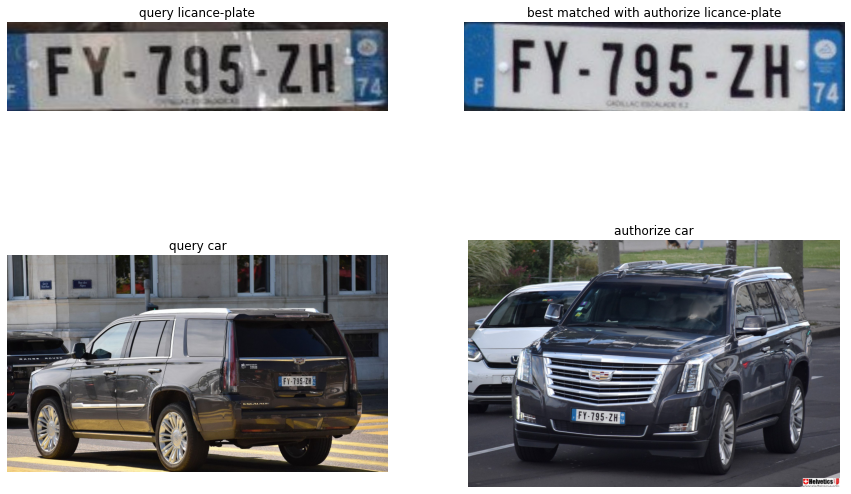

- Best matche score = 49.0 > 15
- Query license-plate = find (car authorized)


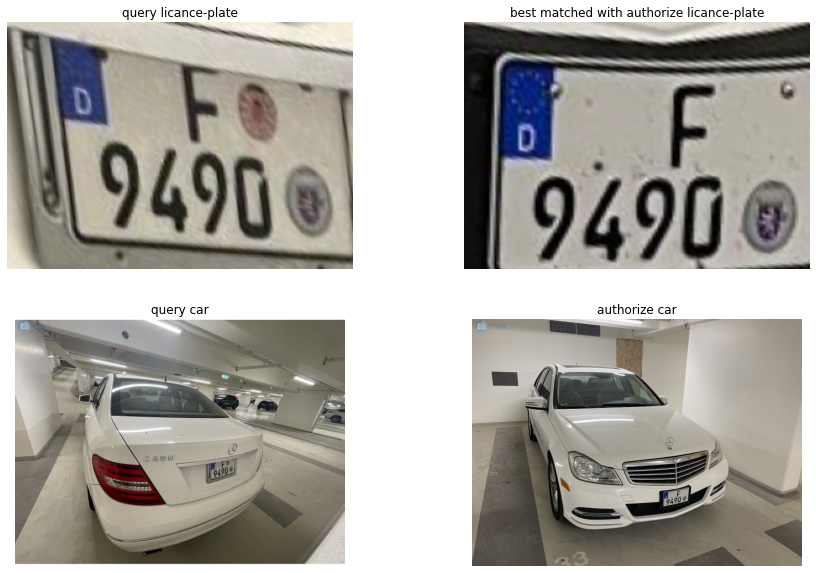

- Best matche score = 44.0 > 15
- Query license-plate = find (car authorized)


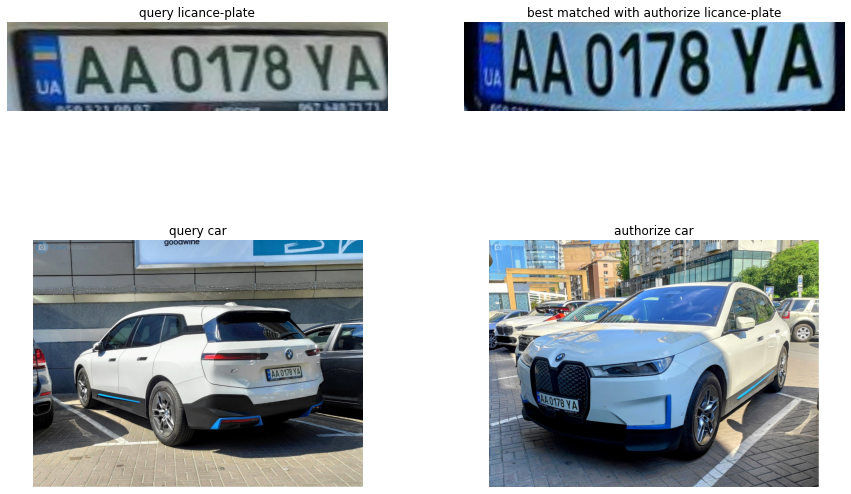

- Best matche score = 38.0 > 15
- Query license-plate = find (car authorized)


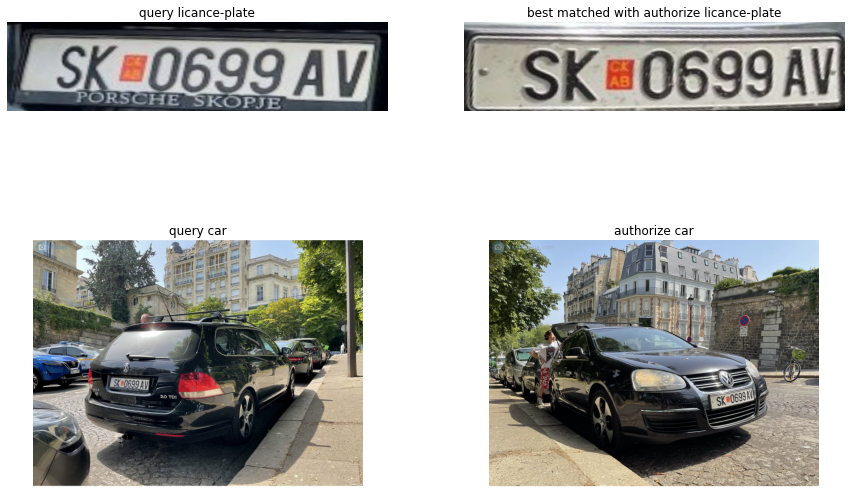

- Best matche score = 82.0 > 15
- Query license-plate = find (car authorized)


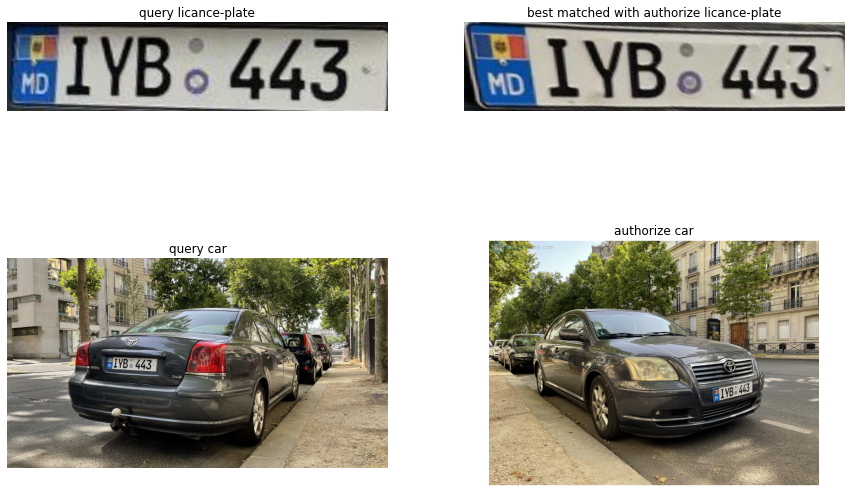

- Best matche score = 36.0 > 15
- Query license-plate = find (car authorized)


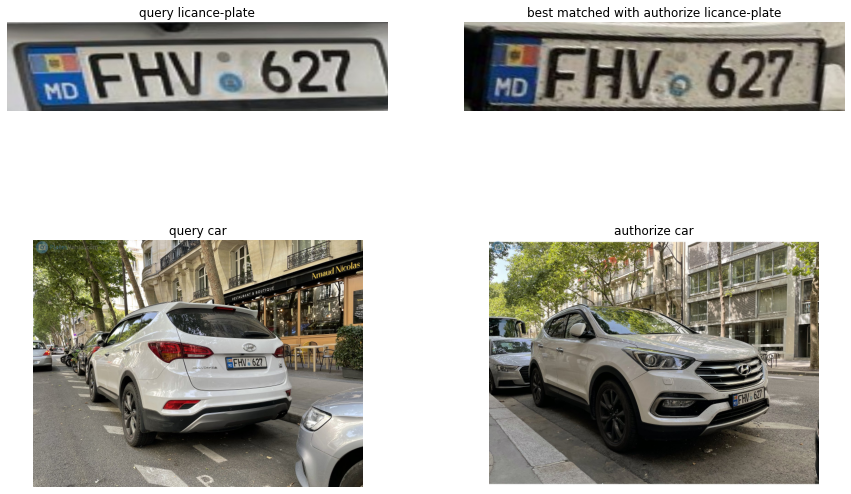

- Best matche score = 74.0 > 15
- Query license-plate = find (car authorized)


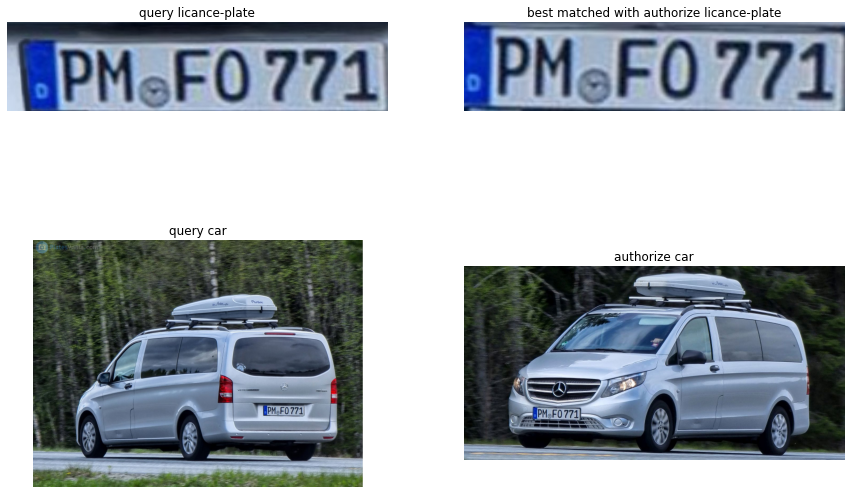

- Best matche score = 74.0 > 15
- Query license-plate = find (car authorized)


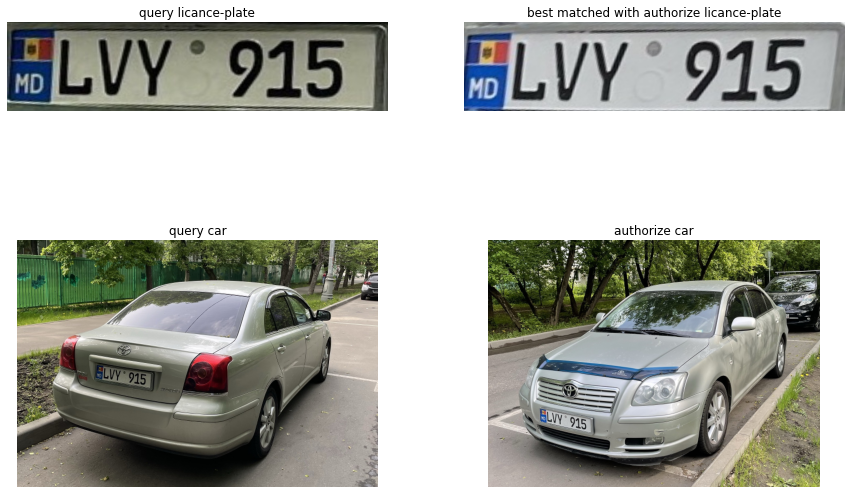

- Best matche score = 5.0 <= 15
- Query license-plate = not find (car no authorized)


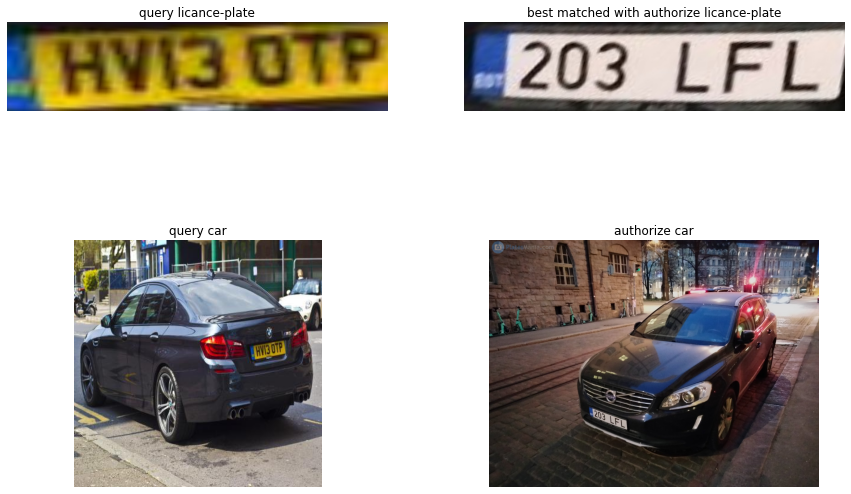

- Best matche score = 9.0 <= 15
- Query license-plate = not find (car no authorized)


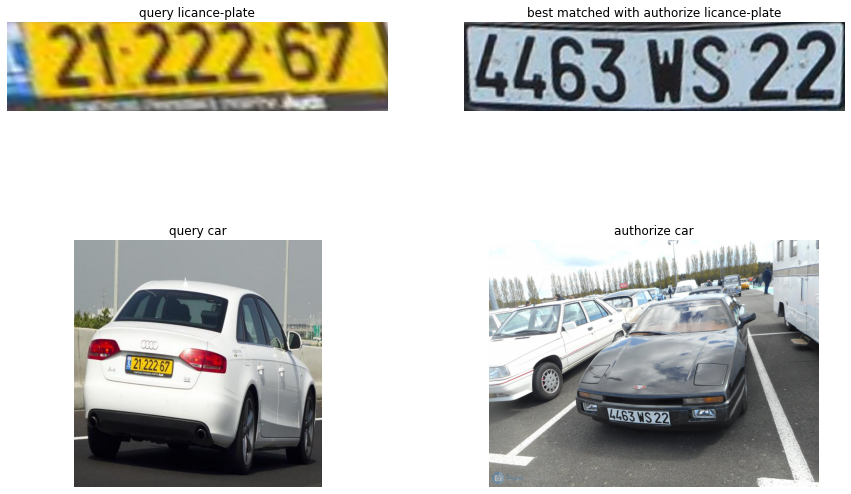

- Best matche score = 10.0 <= 15
- Query license-plate = not find (car no authorized)


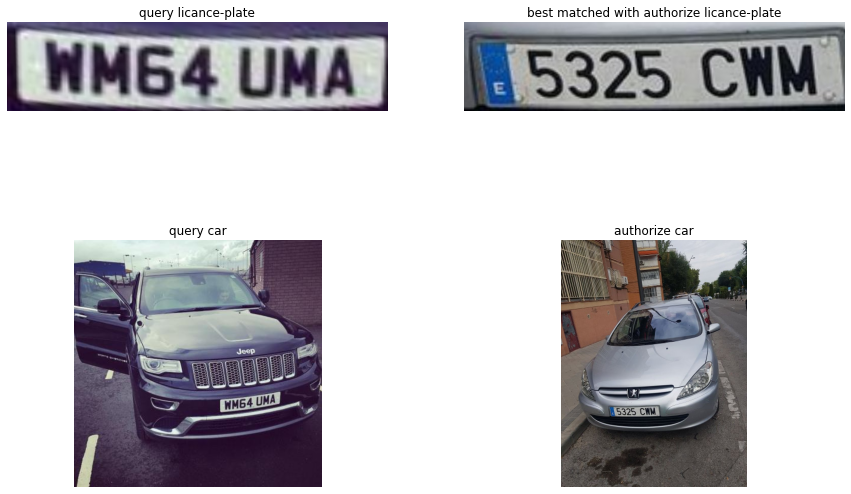

- Best matche score = 13.0 <= 15
- Query license-plate = not find (car no authorized)


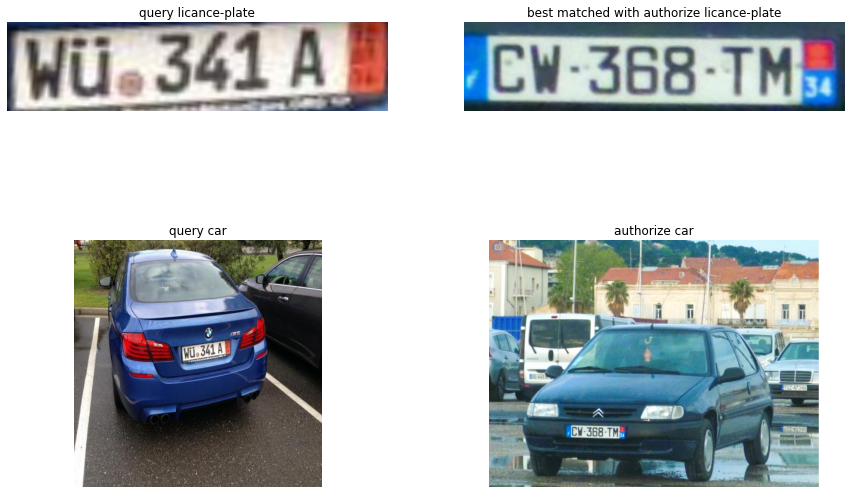

- Best matche score = 11.0 <= 15
- Query license-plate = not find (car no authorized)


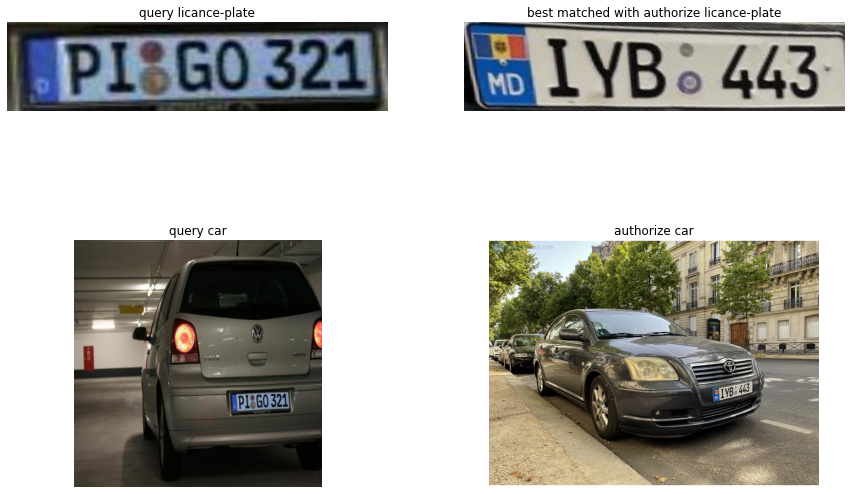

In [11]:
# score_threshold = 15, because after several execution and verification 
# we have noticed that below 15 in matche_score we don't find the exact same license-plate 
score_threshold = 15

for query_indx, query_mat in enumerate(query_mats):
# find if the car are authorizd or not, and get the best matche
    find, find_car, find_mat, best_score = is_find_mat(
        query_mat, auto_mats, auto_cars, score_threshold=score_threshold, display_matches=False
    )

# print the best score matche and if the query_car are find
    if find:
        print(f"- Best matche score = {best_score} > {score_threshold}")
        print("- Query license-plate = find (car authorized)")
    else:
        print(f"- Best matche score = {best_score} <= {score_threshold}")
        print("- Query license-plate = not find (car no authorized)")

# shrink the car images to optimize the display
    if find_car.shape[0] > 700 and find_car.shape[1] > 700:
        find_car = cv2.resize(
            find_car, (0, 0), fx=0.5, fy=0.5, interpolation=cv2.INTER_CUBIC
        )
    query_car = query_cars[query_indx]
    if query_car.shape[0] > 700 and query_car.shape[1] > 700:
        query_car = cv2.resize(
            query_car, (0, 0), fx=0.5, fy=0.5, interpolation=cv2.INTER_CUBIC
        )
        
# display the query_mat and his bast matche find_mat, as well as query_car and its equivalent in authorize cars
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 2, 1)
    plt.imshow(query_mat[:, :, ::-1]), plt.title("query licance-plate"), plt.axis("off")
    plt.subplot(2, 2, 2)
    plt.imshow(find_mat[:, :, ::-1]), plt.title("best matched with authorize licance-plate"), plt.axis("off")
    plt.subplot(2, 2, 3)
    plt.imshow(query_car[:, :, ::-1]), plt.title("query car"), plt.axis("off")
    plt.subplot(2, 2, 4)
    plt.imshow(find_car[:, :, ::-1]), plt.title("authorize car"), plt.axis("off")
    plt.show()
